---

# Project 7. Time Series - Temperature forecast  

## 0) Imports

In [65]:
# plotting, eda
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_pacf, plot_acf

# model
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.ar_model import ar_select_order
from statsmodels.tsa.arima.model import ARIMA
import pmdarima as pm
from sklearn.metrics import mean_squared_error
from math import sqrt

import warnings

## 1) Define the Business Goal

Building a model that can predict temperature for the upcoming days, given the temprature until today, as precisely as possible.

## 2) Get the Data

### 2.1) Load the Data

In [2]:
# creating dataframe: opening txt file, transforming it to csv, skipping the first 19 rows, setting first column as index, and setting it as DateTimeIndex
df = pd.read_csv('../data/TG_STAID004586.txt', skiprows=19, index_col=1, parse_dates=True)

In [3]:
df.head()

,SOUID,TG,Q_TG
DATE,,,
1979-01-01,111448,-119,0
1979-01-02,111448,-93,0
1979-01-03,111448,-78,0
1979-01-04,111448,-96,0
1979-01-05,111448,-99,0


### 2.2) Clean the Data

In [4]:
print(df.columns)

Index([' SOUID', '   TG', ' Q_TG'], dtype='object')


In [5]:
# dropping unnecessary columns
df.drop([' SOUID', ' Q_TG'], axis=1, inplace=True)

In [6]:
# renaming 
df.rename(columns={'   TG': 'temperature'}, inplace=True)

In [7]:
print(df.columns, df.index)

Index(['temperature'], dtype='object') DatetimeIndex(['1979-01-01', '1979-01-02', '1979-01-03', '1979-01-04',
               '1979-01-05', '1979-01-06', '1979-01-07', '1979-01-08',
               '1979-01-09', '1979-01-10',
               ...
               '2020-12-22', '2020-12-23', '2020-12-24', '2020-12-25',
               '2020-12-26', '2020-12-27', '2020-12-28', '2020-12-29',
               '2020-12-30', '2020-12-31'],
              dtype='datetime64[ns]', name='    DATE', length=15341, freq=None)


In [8]:
df.index.names = ['date']

In [9]:
print(df.columns, df.index)

Index(['temperature'], dtype='object') DatetimeIndex(['1979-01-01', '1979-01-02', '1979-01-03', '1979-01-04',
               '1979-01-05', '1979-01-06', '1979-01-07', '1979-01-08',
               '1979-01-09', '1979-01-10',
               ...
               '2020-12-22', '2020-12-23', '2020-12-24', '2020-12-25',
               '2020-12-26', '2020-12-27', '2020-12-28', '2020-12-29',
               '2020-12-30', '2020-12-31'],
              dtype='datetime64[ns]', name='date', length=15341, freq=None)


In [10]:
# setting temperature decimal for easier interpretation 
df['temperature'] = df['temperature'] / 10

In [11]:
df.head()

,temperature
date,
1979-01-01,-11.9
1979-01-02,-9.3
1979-01-03,-7.8
1979-01-04,-9.6
1979-01-05,-9.9


In [12]:
# checking for NaN values 
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 15341 entries, 1979-01-01 to 2020-12-31
Data columns (total 1 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   temperature  15341 non-null  float64
dtypes: float64(1)
memory usage: 239.7 KB


In [13]:
df.isna().sum()

temperature    0
dtype: int64

## 3) Train-Test-Split

In [14]:
# Since we work with TimeSeries, our train data is the first part of the dataset, our test data is the second, smaller part.
# The dataset includes 40 years, therefore the first 32 years will be in the training set and remaining 8 years (2920 days) in the test set. 
df_train = df[:-2920]
df_test = df[-2920:]

In [15]:
df_train

,temperature
date,
1979-01-01,-11.9
1979-01-02,-9.3
1979-01-03,-7.8
1979-01-04,-9.6
1979-01-05,-9.9
...,...
2012-12-29,5.2
2012-12-30,6.5
2012-12-31,7.5


In [16]:
# First day of the test data set: 
df_test.head(1)

,temperature
date,
2013-01-03,7.4


## 4) Visualize the Data

In [17]:
fig1 = px.line(df_train, y=df_train["temperature"], 
               #width=2000, 
               #height=800,
               title="Daily mean of temperature in Berlin, Treptow between 1980-2020", 
               labels={ # replaces default labels by column name
                "date": "Year",  "temperature": "Temperature (Celcius degree)"},
              )
fig1.show()

### 4.1. Trend

In [18]:
df_train['timestep'] = range(len(df_train))

<ipython-input-18-d1b75fcf1738>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [50]:
X_trend = df_train[['timestep']]
y = df_train['temperature']

In [21]:
m = LinearRegression()

In [51]:
m.fit(X_trend, y)

LinearRegression()

In [52]:
df_train['trend'] = m.predict(X_trend)

In [25]:
fig_trend1 = go.Figure()

fig_trend1.add_trace(go.Scatter(x=df_train.index.values, y=df_train['temperature'], name='Temperature'))
fig_trend1.update_layout(title_text='Trend with linear regression',
                  title_x=0.5,
                 )
#fig.add_trace(go.Scatter(x=df.index.values, y=seasonal_trend, name='Seasonal trend'))
fig_trend1.add_trace(go.Scatter(x=df_train.index, y=df_train['trend'], name='Trend'))

fig_trend1.show()

In [26]:
# Locally WEighted Scatterplot Smoothing (LOWESS) - non-linear LOWESS trendlines.

fig_trend2 = px.scatter(df_train, x=df_train.index, y="temperature", 
                  color='temperature', 
                  trendline="ols", #lowess, expanding
                  trendline_color_override="red", 
                  title="Trendline with OLS",
                  labels={"date": "Year",  "temperature": "Temperature"})
fig_trend2.update_layout(
    title={'x':0.5})
fig_trend2.show()

### 4.2. Seasonality

In [27]:
month_dummies = pd.get_dummies(df_train.index.month, drop_first=True, prefix='month').set_index(df_train.index)

In [42]:
df_train = df_train.join(month_dummies)

In [43]:
X_seasonal = df_train.drop(['temperature', 'trend'], axis=1)

In [44]:
m.fit(X_seasonal, y)

LinearRegression()

In [45]:
df_train['trend_seasonal'] = m.predict(X_seasonal)

In [46]:
df_train.head(1)

,temperature,timestep,trend,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,trend_seasonal
date,,,,,,,,,,,,,,,
1979-01-01,-11.9,0,9.241146,0,0,0,0,0,0,0,0,0,0,0,-0.018402


In [47]:
fig_seasonal = go.Figure()

fig_seasonal.add_trace(go.Scatter(x=df_train.index.values, y=df_train['temperature'], name='Temperature'))
fig_seasonal.add_trace(go.Scatter(x=df_train.index.values, y=df_train['trend_seasonal'], name='Seasonality'))
fig_seasonal.update_layout(title_text='Seasonality',title_x=0.5)
fig_seasonal.show()

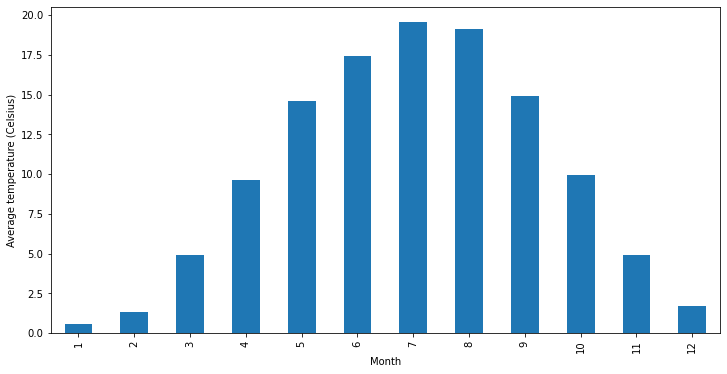

In [48]:
ax = df_train.groupby(df_train.index.month)['temperature'].mean().plot(kind="bar", xlabel='Month', ylabel='Average temperature (Celsius)')
# ax.set_xticks(range(12))
plt.rcParams['figure.figsize'] = (12, 6)

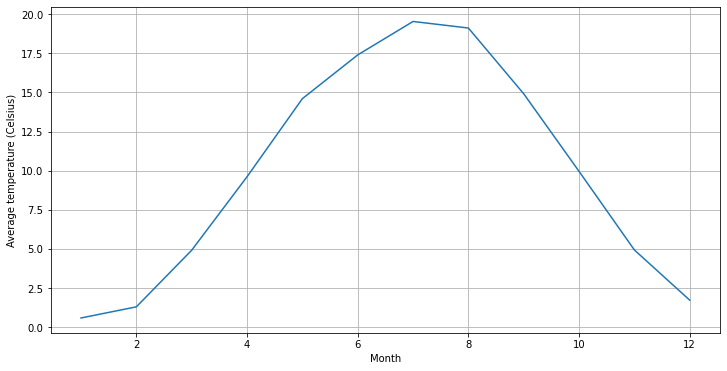

In [49]:
ax = df_train.groupby(df_train.index.month)['temperature'].mean().plot(xlabel='Month', ylabel='Average temperature (Celsius)', grid=True)
plt.rcParams['figure.figsize'] = (12, 6)

### 4. 3. Remainder

In [56]:
df_train['remainder'] = df_train['temperature'] - df_train['trend_seasonal']

In [66]:
df_train.head(1)

,temperature,timestep,trend,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,trend_seasonal,remainder
date,,,,,,,,,,,,,,,,
1979-01-01,-11.9,0,9.241146,0,0,0,0,0,0,0,0,0,0,0,-0.018402,-11.881598


In [61]:
fig_remainder = go.Figure()
fig_remainder.add_trace(go.Scatter(x=df_train.index.values, y=df_train['remainder'], name='Remainder'))
fig_remainder.update_layout(title_text='Remainder',title_x=0.5)
fig_remainder.show()

### 4.4. Autoregression 

In [68]:
# For PACF and ACF plotting, we drop all columns from df_train dataset. 
# We needed trend, seasonality and remainder for plotting purposes. 
# Keeping only the temperature.

df_train = df_train['temperature']

In [72]:
df_train.head(3)

date
1979-01-01   -11.9
1979-01-02    -9.3
1979-01-03    -7.8
Name: temperature, dtype: float64

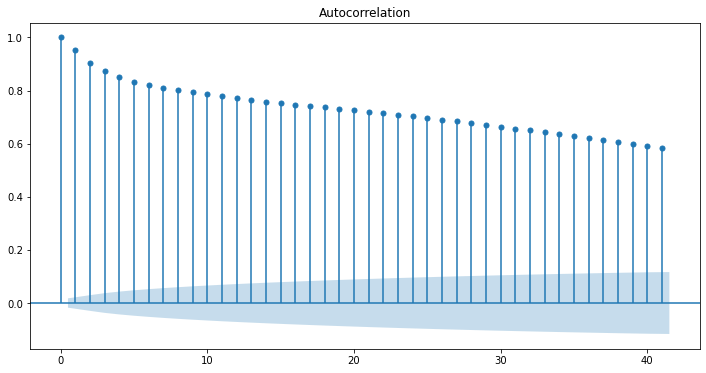

In [70]:
# plotting autocorrelation and partial autocorrelation plot
plot_acf(df_train);

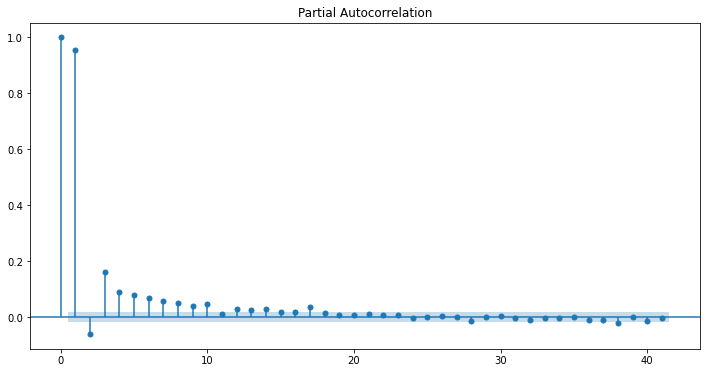

In [71]:
plot_pacf(df_train);

## 5) Feature Engineer - Lags

### Determining Model

Remarks on the time series:

   1.  has a clear positive trend
   2.  has a clear seasonality
   3.  may have additional time dependence

### 5.1. How to interpret the ACF-plot and the PACF-plot:

#### AR process:

If the ACF-Plot is showing an exponential and slow decay, and the PACF-Plot shows a drop after a certain lag, we conclude that the data is best modelled by an AR(p) process. p is given by the last meaningful lag in the PACF-Plot. 

p = 3 or 10 (?)

#### MA process:

If the ACF-Plot is showing a drop after a certain lag, and the PACF-Plot shows an exponential and slow decay, we conclude that the data is best modelled by an MA(q) process. q is given by the last meaningful lag in the ACF-Plot.

q= 0 (ACF plot does not show a drop, lags decrease steadily, PACF plot does not show slow decay)

#### ARIMA process:

If both the ACF-Plot and the PACF-Plot are showing an exponential and slow decay, we conclude that the data is best modelled by an ARIMA(p,d,q) process. p and q cannot be inferred from the plots. Usually you would use an iterrative approach and try different combinations to find the best model.

#### Integrated(I)

Integrating a time series is an alternative way to model a trend of the time series. It is basicalley, differenceing the trend. By obvious, on the plot visible linear trend, I is 1. No trend 0.

### 5.2 Box-Jenkins-Methodology

In [76]:
# ar_select_order calculates the nr of lags we should use  
order = ar_select_order(df_train, maxlag=11)
order.ar_lags

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10])

## 6) Train a model

### 6.1. Statsmodel Autoregression model 

In [78]:
ar_model = AutoReg(df_train, lags=10).fit()

In [79]:
ar_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            AutoReg Model Results                             
==============================================================================
Dep. Variable:            temperature   No. Observations:                12421
Model:                    AutoReg(10)   Log Likelihood              -27929.305
Method:               Conditional MLE   S.D. of innovations              2.297
Date:                Sun, 14 Nov 2021   AIC                              1.665
Time:                        21:02:49   BIC                              1.672
Sample:                    01-11-1979   HQIC                             1.667
                         - 01-02-2013                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
intercept           0.2609      0.034      7.567      0.000       0.193       0.328
temperature.L1      0.9833      0.009    109.653      0.000       0.966       1.001
temperature.L2     -0.2144      0.013    -17.037      0.000      -0.239      -0.190
temperature.L3      0.0773      0.013      6.078      0.000       0.052       0.102
temperature.L4      0.0192      0.013      1.503      0.133      -0.006       0.044
temperature.L5      0.0126      0.013      0.990      0.322      -0.012       0.038
temperature.L6      0.0225      0.013      1.765      0.078      -0.002       0.047
temperature.L7      0.0116      0.013      0.911      0.362      -0.013       0.037
temperature.L8      0.0218      0.013      1.712      0.087      -0.003       0.047
temperature.L9     -0.0058      0.013     -0.459      0.646      -0.030       0.019
temperature.L10     0.0457      0.009      5.100      0.000       0.028       0.063
                                    Roots                                     
==============================================================================
                   Real          Imaginary           Modulus         Frequency
------------------------------------------------------------------------------
AR.1             1.0147           -0.0000j            1.0147           -0.0000
AR.2             1.0982           -0.6677j            1.2853           -0.0869
AR.3             1.0982           +0.6677j            1.2853            0.0869
AR.4             0.5883           -1.2549j            1.3860           -0.1802
AR.5             0.5883           +1.2549j            1.3860            0.1802
AR.6            -1.4864           -0.0000j            1.4864           -0.5000
AR.7            -1.1218           -0.9764j            1.4872           -0.3860
AR.8            -1.1218           +0.9764j            1.4872            0.3860
AR.9            -0.2658           -1.4127j            1.4375           -0.2796
AR.10           -0.2658           +1.4127j            1.4375            0.2796
------------------------------------------------------------------------------
"""

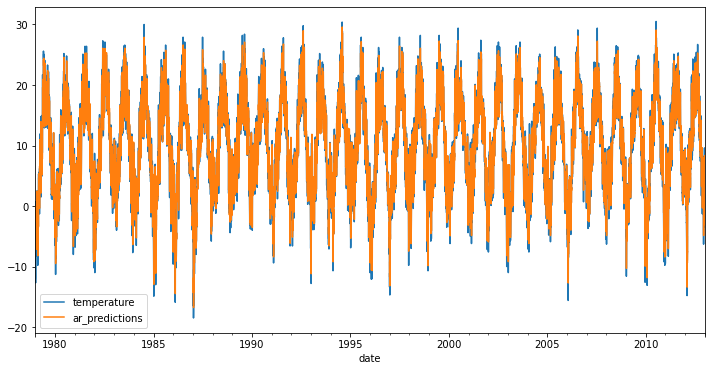

In [87]:
# Plot the prediction
df_train.plot()
plt.plot(ar_model.predict(), label='ar_predictions')
plt.legend()
plt.show()

In [88]:
ar_model.predict()

1979-01-01         NaN
1979-01-02         NaN
1979-01-03         NaN
1979-01-04         NaN
1979-01-05         NaN
                ...   
2012-12-29   -0.479916
2012-12-30    6.335629
2012-12-31    5.923798
2013-01-01    7.024145
2013-01-02    6.222390
Freq: D, Length: 12421, dtype: float64

### 6.2. ARIMA Model 

In [119]:
model = ARIMA(df_train, order=(2,0,2)) # instanciation

model_fit = model.fit() # fit 

# summary of fit model
print(model_fit.summary())

                               SARIMAX Results                                
Dep. Variable:            temperature   No. Observations:                12421
Model:                 ARIMA(2, 0, 2)   Log Likelihood              -27936.609
Date:                Sun, 14 Nov 2021   AIC                          55885.217
Time:                        21:51:25   BIC                          55929.780
Sample:                    01-01-1979   HQIC                         55900.140
                         - 01-02-2013                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          9.4980      0.997      9.527      0.000       7.544      11.452
ar.L1          1.5886      0.018     88.714      0.000       1.554       1.624
ar.L2         -0.5920      0.018    -33.635      0.0

In [120]:
model_fit.forecast(2)

2013-01-03    4.905903
2013-01-04    4.933188
Freq: D, Name: predicted_mean, dtype: float64

In [83]:
df_test.head(2)

,temperature
date,
2013-01-03,7.4
2013-01-04,8.2


In [121]:
model_fit.resid

date
1979-01-01   -21.398006
1979-01-02     1.645525
1979-01-03     0.461807
1979-01-04    -2.142289
1979-01-05    -0.449118
                ...    
2012-12-29     5.797164
2012-12-30     0.314305
2012-12-31     1.693044
2013-01-01    -0.295273
2013-01-02    -0.842080
Length: 12421, dtype: float64

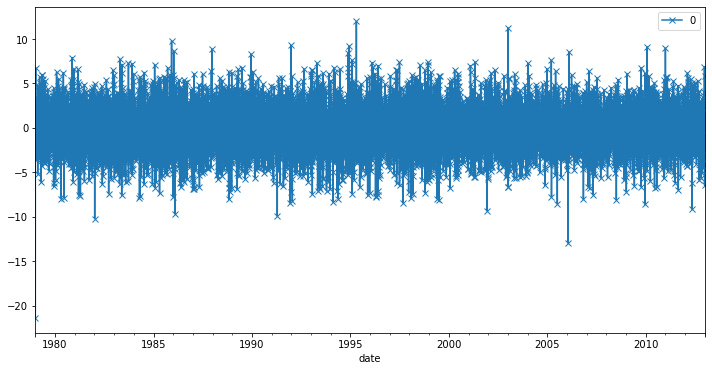

In [122]:
# line plot of residuals
# plot suggests that there may still be some trend information not captured by the model

residuals = pd.DataFrame(model_fit.resid)

residuals.plot(marker='x')
plt.show()

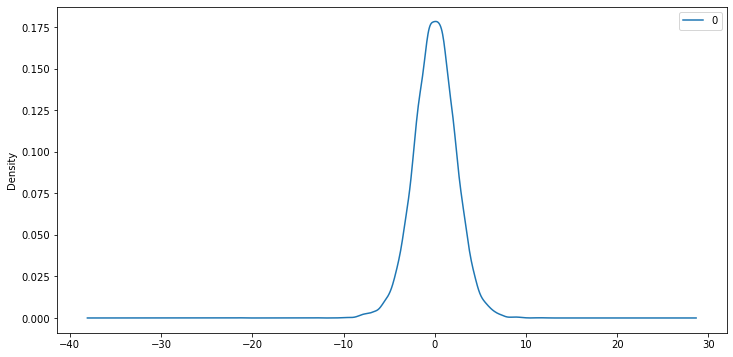

In [123]:
# density plot of residuals
# appears to be centered at a value slightly higher than zero, but the shape is Gaussian

residuals.plot(kind='kde')
plt.show()

In [54]:
# summary stats of residuals. closer the mean to the 0, the better the model. 
print(residuals.describe())

                  0
count  14976.000000
mean       0.001643
std        2.272936
min      -12.810977
25%       -1.443492
50%        0.020844
75%        1.452118
max       11.942363


In [150]:
X = df_train.values
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]

In [151]:
# defining the list history and performing rolling forecast

history = [x for x in train]

predictions = list()

# walk-forward validation
for t in range(len(test)):
    model = ARIMA(history, order=(5,1,0))
    model_fit = model.fit()
    output = model_fit.forecast() # one prediction ahead in the future 
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)
    print('predicted=%f, expected=%f' % (yhat, obs))

predicted=11.533557, expected=12.000000
predicted=12.552919, expected=10.300000
predicted=10.586792, expected=13.300000
predicted=13.661022, expected=15.500000
predicted=15.156734, expected=17.100000
predicted=16.410338, expected=18.700000
predicted=17.926177, expected=16.900000
predicted=15.967794, expected=15.900000
predicted=15.760057, expected=15.000000
predicted=15.142697, expected=16.200000


KeyboardInterrupt: 

In [152]:
rmse = sqrt(mean_squared_error(test, predictions))
print('Test RMSE: %.3f' % rmse)

ValueError: Found input variables with inconsistent numbers of samples: [4224, 10]

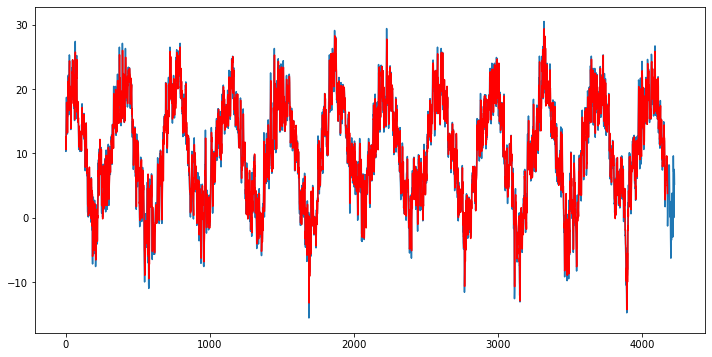

In [125]:
# plot forecasts against actual outcomes
plt.plot(test)
plt.plot(predictions, color='red')
plt.show()

## 7) Cross-Validate and Optimize Hyperparameters

### Tuning an ARIMA model

#### 1. With model evaluation Function


    1. Model Identification Use plots and summary statistics to identify trends, seasonality, and autoregression elements to get an idea of the amount of differencing and the size of the lag that will be required
    2. Parameter Estimation Use a fitting procedure to find the coefficients of the regression model
    3. Model Checking Use plots and statistical tests of the residual errors to determine the amount and type of temporal structure not captured by the model
    4. process is repeated until either a desirable level of fit is achieved on the in-sample or out-of-sample observations (e.g. training or test datasets)


In [160]:
# choose the search space for the Grid Search tuning

p_values = range(0, 10)
d_values = range(0, 0)
q_values = range(0, 1)

In [161]:
# dfining function for the evaluation of the arima model 

def evaluate_arima_model(X, arima_order):
    train_size = int(len(X) * 0.66)
    train, test = X[0:train_size], X[train_size:]
    history = [x for x in train]
    # make predictions
    predictions = list()
    for t in range(len(test)):
        model = ARIMA(history, order=arima_order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(test[t])
    # calculate out of sample error
    error = mean_squared_error(test, predictions)
    return error

In [162]:
# define function for evaluating different ARIMA models with different combination of p, d, q values  

def evaluate_models(dataset, p_values, d_values, q_values):
    dataset = dataset.astype('float32')
    best_score, best_cfg = float("inf"), None
    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q)
                try:
                    mse = evaluate_arima_model(dataset, order)
                    if mse < best_score:
                        best_score, best_cfg = mse, order
                        print('ARIMA%s MSE=%.3f' % (order,mse))
                except:
                    continue
    print('Best ARIMA%s MSE=%.3f' % (best_cfg, best_score))


In [163]:
warnings.filterwarnings("ignore")
evaluate_models(df_train, p_values, d_values, q_values)

Best ARIMANone MSE=inf


#### 2. Automatic ARIMA model tuner - pmdarima.arima.auto_arima

In [ ]:
https://alkaline-ml.com/pmdarima/modules/generated/pmdarima.arima.auto_arima.html

In [117]:
model_pmdarima = pm.auto_arima(df_train, max_p=10)

In [118]:
model_pmdarima

ARIMA(order=(2, 0, 2), scoring_args={}, suppress_warnings=True)

## 8) Test

In [ ]:
df_test_fe = feature_engineer(df_test)

y_test = df_test_fe.copy().iloc[:,0]
X_test = df_test_fe.copy().iloc[:,1:]

In [126]:
df_test

,temperature
date,
2013-01-03,7.4
2013-01-04,8.2
2013-01-05,6.9
2013-01-06,6.5
2013-01-07,3.8
...,...
2020-12-27,1.6
2020-12-28,2.8
2020-12-29,2.3


In [ ]:
r2 = round(m.score(X_test, y_test), 2)

In [ ]:
print(f'The R-squared of our model is {r2}')